In [2]:
from tools import datacleaner as dtclean
from tools import dataexplore as dtexp
from view import data_visualization as dtview
import pandas as pd
import numpy as np
from fbprophet import Prophet
from evaluation import forecast_metrics as fm
import seaborn as sns
import plotly.graph_objs as go
import plotly.tools
import matplotlib.pyplot as plt
# Offline mode
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import warnings

warnings.filterwarnings('ignore')
# "high resolution"
%config InlineBackend.figure_format = 'retina'
init_notebook_mode(connected=True)

# Visualizando o dataframe

In [3]:
df_274_time_sale = dtclean.get_Dataframes_time(274,'s')
df_274_time_sale.reset_index(inplace=True)
df_274_sale = dtclean.get_Dataframes(274,'s')
df_274_sale.reset_index(inplace=True)

sns.set(style="darkgrid")
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
print('Data início: {}, Data final: {}'.format(df_274_time_sale.ds.min(),df_274_time_sale.ds.max()))
df_274_time_sale.info()

Data início: 2020-03-01 07:30:00, Data final: 2020-05-31 20:30:00
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2555 entries, 0 to 2554
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      2555 non-null   datetime64[ns]
 1   y       2555 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 40.0 KB


In [4]:
iplot(dtview.plot_scatter(df_274_time_sale,title='Produtos vendidos'))

In [5]:
df_274_time_sale.describe()


,y
count,2555.000000
mean,305.015656
std,192.532353
min,1.000000
25%,167.000000
50%,277.000000
75%,408.500000
max,1362.000000


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


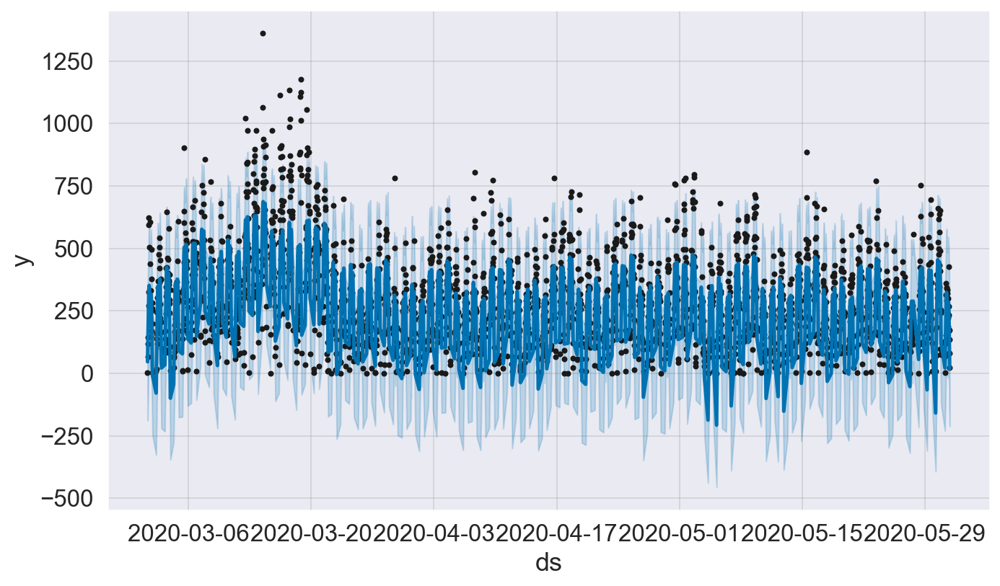

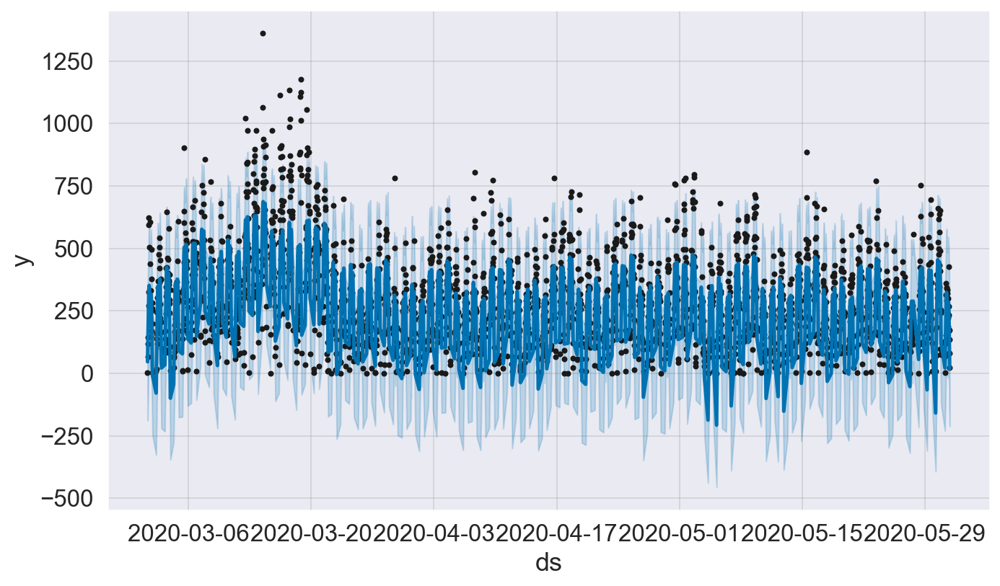

In [6]:
model = Prophet(interval_width=0.95)
model.fit(df_274_time_sale)
forecast = model.predict(df_274_time_sale)
model.plot(forecast)


# Análise dos Dados

In [7]:
iplot(dtview.plot_scatter(df_274_time_sale,title='Vendas/hora (março-maio de 2020)'))

In [8]:
df_new = dtexp.date_features(df_274_time_sale)
iplot(dtview.plot_df_features_as_table(df_new))

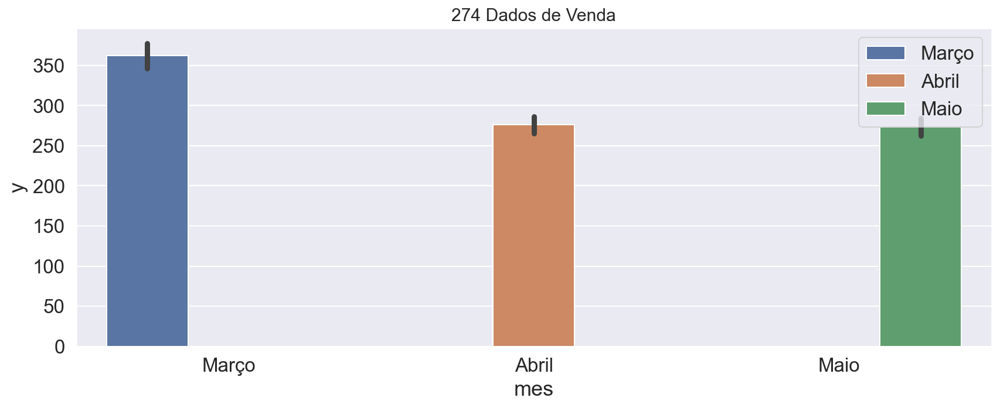

In [9]:
fig, ax = plt.subplots(figsize=(14,5))
dtview.plot_df_features(df_new,fig, ax).show()
#plt.show()

Text(0.5, 1.0, 'Total Vendas Por Dia da Semana')

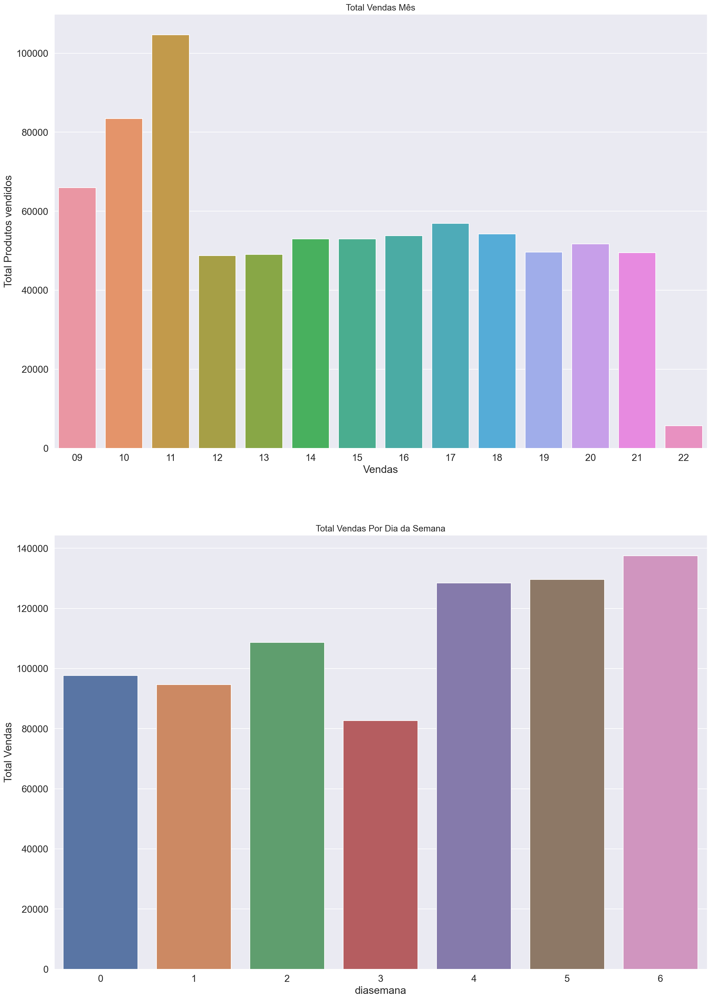

In [10]:
fig,(ax1,ax2)= plt.subplots(nrows=2)
fig.set_size_inches(20,30)

mesAgregado = pd.DataFrame(df_new.groupby("semana")["y"].sum()).reset_index().sort_values('y')
sns.barplot(data=mesAgregado,x="semana",y="y",ax=ax1)
ax1.set(xlabel='Vendas', ylabel='Total Produtos vendidos')
ax1.set_title("Total Vendas Mês",fontsize=15)

semanaAgregada = pd.DataFrame(df_new.groupby("num")["y"].sum()).reset_index().sort_values('num')
sns.barplot(data=semanaAgregada,x="num",y="y",ax=ax2)
ax2.set(xlabel='diasemana', ylabel='Total Vendas')
ax2.set_title("Total Vendas Por Dia da Semana",fontsize=15)

In [11]:
semanaAgregada.sort_values('y')

,num,y
3,3,82658
1,1,94657
0,0,97716
2,2,108675
4,4,128466
5,5,129595
6,6,137548


In [12]:
df_274_sale_treino, df_274_sale_teste = dtexp.configura_dataframe_treino_teste(df_274_time_sale)
print('-'*60)
print('Shape dataframe de treino --> {}'.format(df_274_sale_treino.shape))
print('Shape dataframe de teste --> {}'.format(df_274_sale_teste.shape))
print('-'*60)

------------------------------------------------------------
Shape dataframe de treino --> (2344, 2)
Shape dataframe de teste --> (212, 2)
------------------------------------------------------------


# Visualizando o montante de dados para os datasets de treino e de teste

In [14]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sale_treino,
                                   df_274_sale_teste,
                                   title='Montante de dados de vendas de Treinamento e Teste',
                                    mode='lines',
                                   name1='Treinamento',
                                   name2='Teste'))

In [15]:
prophet = Prophet()
prophet.fit(df_274_sale_treino)
future_vendas = prophet.make_future_dataframe(periods=30, freq='30min')
# Removendo valores fora do range de atendimento da loja (22:30 - 05:59)
future_vendas['ds'] = pd.to_datetime(future_vendas['ds'])
future_vendas = future_vendas.set_index(pd.DatetimeIndex(future_vendas['ds']))
future_vendas = future_vendas.between_time('08:00','21:00')

forecast_vendas = prophet.predict(future_vendas)

# forecast_vendas['yhat'].loc[(forecast_vendas['yhat'] < 0)] = 0
# forecast_vendas['yhat_lower'].loc[(forecast_vendas['yhat_lower'] < 0)] = 0
# forecast_vendas['yhat_upper'].loc[(forecast_vendas['yhat_upper'] < 0)] = 0

iplot(dtview.plot_forecast_as_table(forecast_vendas))

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


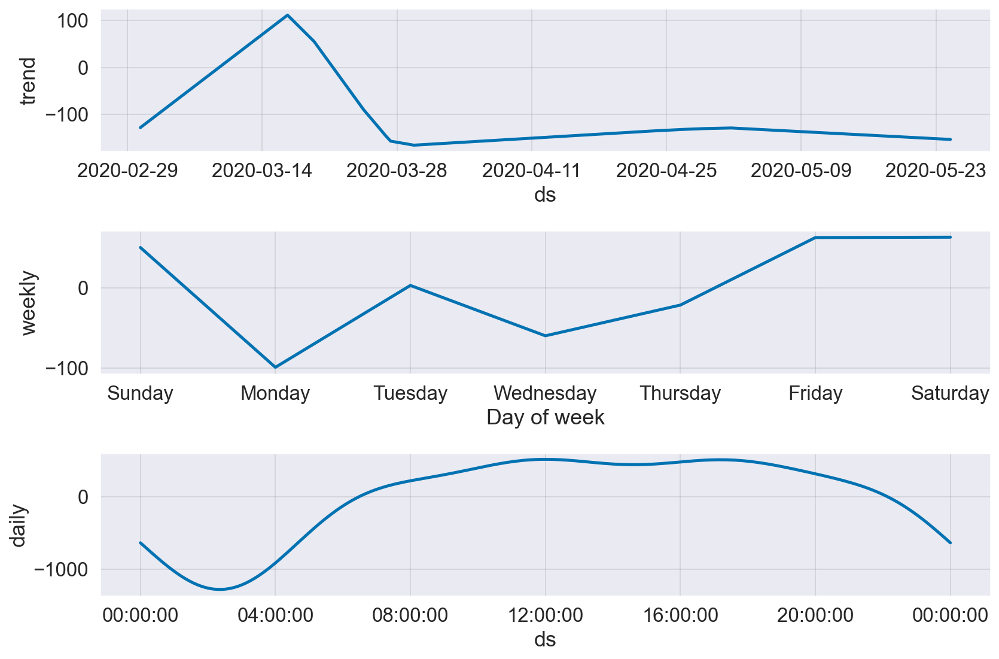

In [16]:
# componentes

fig = prophet.plot_components(forecast_vendas, figsize=(12,8))

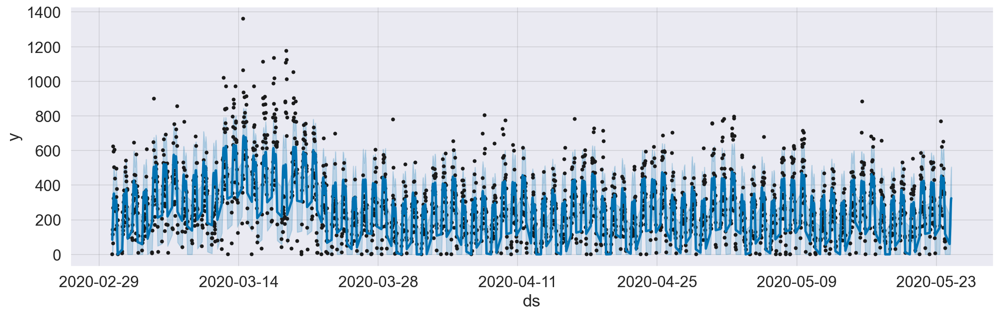

In [17]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = prophet.plot(forecast_vendas,ax=ax)
plt.show()

In [18]:
df_274_sale_teste_forecast = prophet.predict(df_274_sale_teste)
iplot(dtview.plot_forecast_as_table(df_274_sale_teste_forecast))

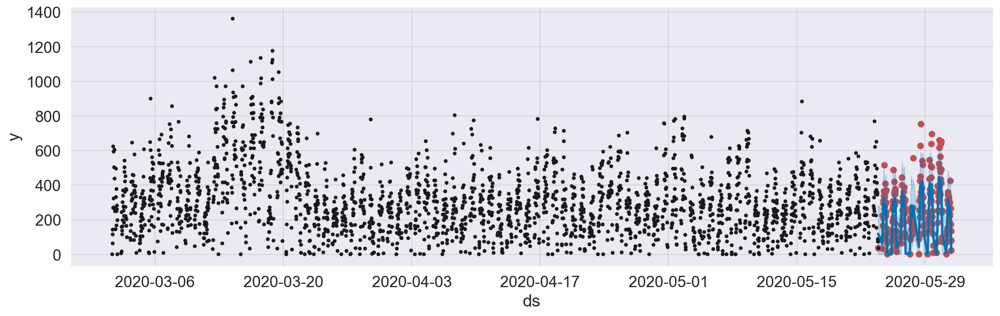

In [19]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_274_sale_teste.ds,df_274_sale_teste['y'], color='r')
fig = prophet.plot(df_274_sale_teste_forecast,ax=ax)
plt.show()


# Comparação entre as vendas previstas e realizadas


In [21]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sale_teste,
                                   df_274_sale_teste_forecast,
                                   title='Previsão de vendas vs Vendas originais realizadas',
                                    mode='lines',
                                   name1='Teste',
                                   name2='Previsto',
                                  is_forecast=True))

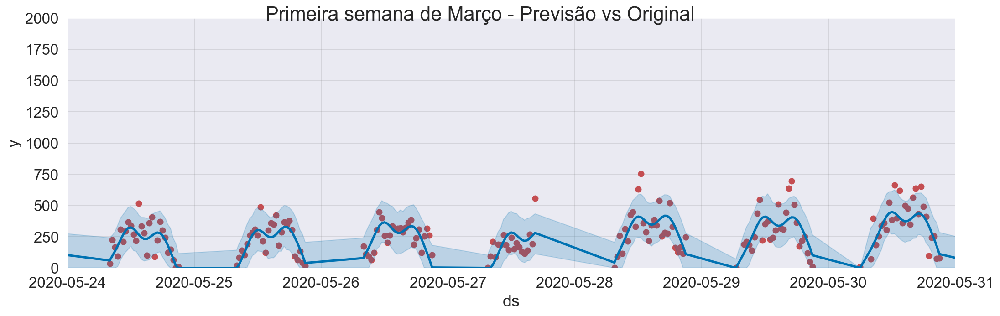

In [22]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_274_sale_teste.ds, df_274_sale_teste['y'], color='r')
fig = prophet.plot(df_274_sale_teste_forecast, ax=ax)
ax.set_xbound(lower='2020-05-24', upper='2020-05-31')
ax.set_ylim(0, 2000)
plot = plt.suptitle('Primeira semana de Março - Previsão vs Original')

In [23]:
print("MAPE para validar ------> {}".format(fm.mape(np.array(df_274_sale_teste['y']),
                                                    np.array(df_274_sale_teste_forecast['yhat']))))


MAPE para validar ------> 0.7240836968973005


In [24]:
iplot(dtview.compare_dataframes_with_bar(
    df_274_sale_teste,
    df_274_sale_teste_forecast,
    nametrace1='Valor Real',
    nametrace2='Valor Previsto',
    idx_end=28))

In [29]:
# Criando novo modelo com os feriados

In [30]:
prophet_feriados = Prophet(holidays=dtclean.get_Holiday())
prophet_feriados.add_country_holidays('BR')
prophet_feriados.fit(df_274_sale_treino)
# Criando as datas futuras previstas pelo prophet
# A frequência especificada em horas (os dados estão em horas)
future_feriados = prophet_feriados.make_future_dataframe(freq='D', periods=7)
# Prevendo os valores
forecast_feriados = prophet_feriados.predict(future_feriados)
# Removendo valores fora do range de atendimento da loja (22:30 - 05:59)
future_feriados['ds'] = pd.to_datetime(future_feriados['ds'])
future_feriados = future_feriados.set_index(pd.DatetimeIndex(future_feriados['ds']))
future_feriados = future_feriados.between_time('08:00','21:00')
# Previsão optimizada dos valores
forecast_feriados = prophet_feriados.predict(future_feriados)
iplot(dtview.plot_forecast_as_table(forecast_feriados))

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


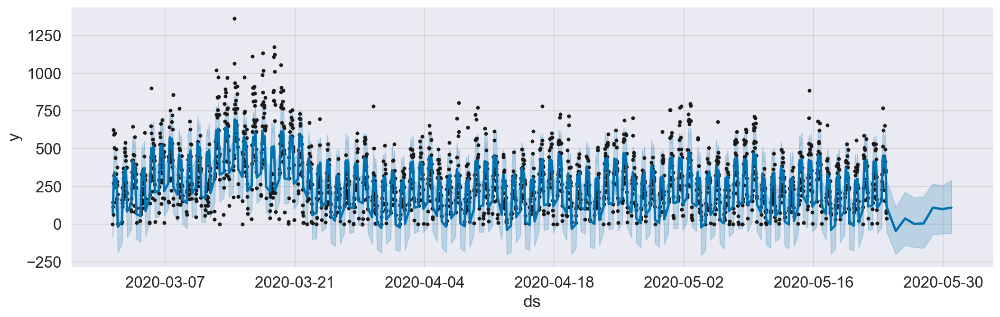

In [31]:
plt,fig_forecast_feriado = dtview.plot_forecast(forecast_feriados,prophet_feriados,f,ax)
plt.show()

# Visualizando os componentes do modelo

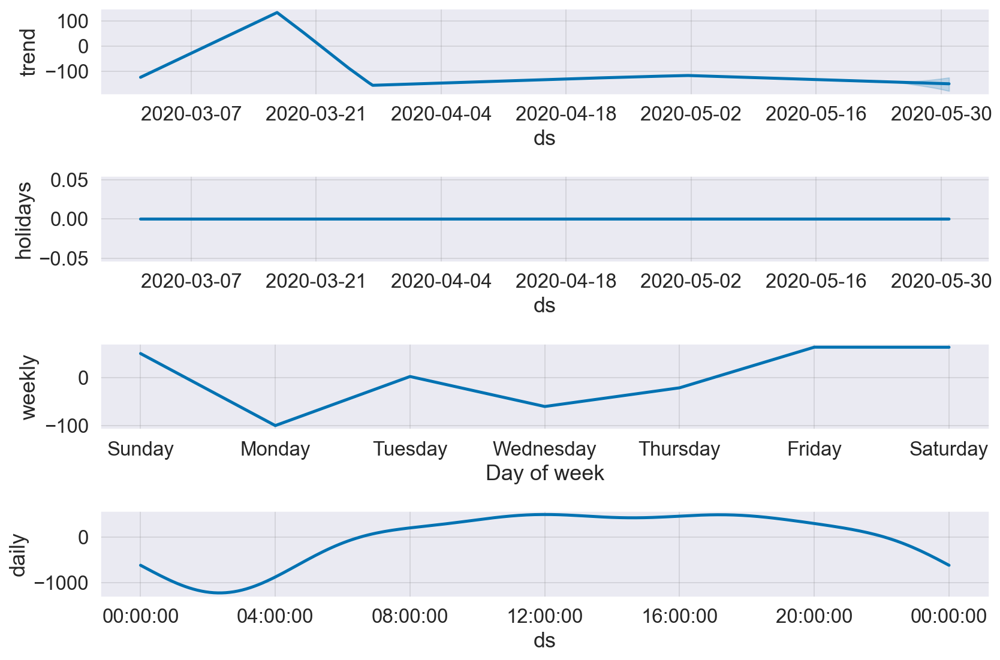

In [33]:
fig_forecast_feriado = prophet_feriados.plot_components(forecast_feriados, figsize=(12,8))

## Visualizar tabela de previsão de teste

In [34]:
forecast_teste_feriados = prophet_feriados.predict(df_274_sale_teste)
iplot(dtview.plot_forecast_as_table(forecast_teste_feriados))

## Visualizar dataframe de teste previsto e original com feriados

In [35]:
iplot(dtview.compare_dataframes_with_scatter(
    df_274_sale_teste,
    forecast_teste_feriados,
    title='Dados Previsto vs Original última semana de maio/2020',
    mode='lines',
    name1='Original',
    name2='Previsão com feriados',
    is_forecast=True))

In [38]:
mape_com_feriados = fm.mape(np.array(df_274_sale_teste.y),np.array(forecast_teste_feriados.yhat))
print("MAPE",mape_com_feriados)

MAPE 1.5718798657989619


In [39]:
'''Utilizar apenas quando prever melhor conjunto de parâmetros. Acessar o arquivo model_parameters_274_vendas.csv'''
# dtexp.tuning_model(df_274_sale_treino,df_274_time_sale,periodo=226,frequencia='D',loja='274',tipo='vendas')

'Utilizar apenas quando prever melhor conjunto de parâmetros. Acessar o arquivo model_parameters_274_vendas.csv'

In [40]:
parameters_df = pd.read_csv('model_parameters_274_vendas.csv',sep='\t')
parameters_df = parameters_df.sort_values(by=['MAPE'])
parameters_df = parameters_df.reset_index(drop=True)
parameters_df.drop(['Unnamed: 0'],axis=1,inplace=True)
trace_df_parameters=go.Table(header=dict(values=list(parameters_df[['MAPE','Parameters']])),
                            cells=dict(values=[parameters_df.MAPE,
                                               parameters_df.Parameters]))
data=[trace_df_parameters]
fig_df_parameters=go.Figure(data=data)
iplot(fig_df_parameters)


## Treinando o modelo com os melhores parâmetros identificados

+ changepoint_prior_scale= 15
+ holidays_prior_scale = 15
+ n_changepoints = 200
+ seasonality_mode = 'multiplicative'
+ seasonality_prior_scale = 25

In [41]:
# Configurando e treinando o modelo com feriados e parâmetros otimizados
final_prophet = Prophet(holidays=dtclean.get_Holiday(),
                      changepoint_prior_scale= 15,
                      holidays_prior_scale = 15,
                      n_changepoints = 200,
                      seasonality_mode = 'multiplicative',
                      seasonality_prior_scale = 25,
                      weekly_seasonality=True,
                      daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)
final_prophet.add_country_holidays(country_name='BR')
final_prophet.fit(df_274_sale_treino)

In [42]:
future_final = final_prophet.make_future_dataframe(periods=7, freq='D')
forecast_final = final_prophet.predict(future_final)
iplot(dtview.plot_forecast_as_table(forecast_final))

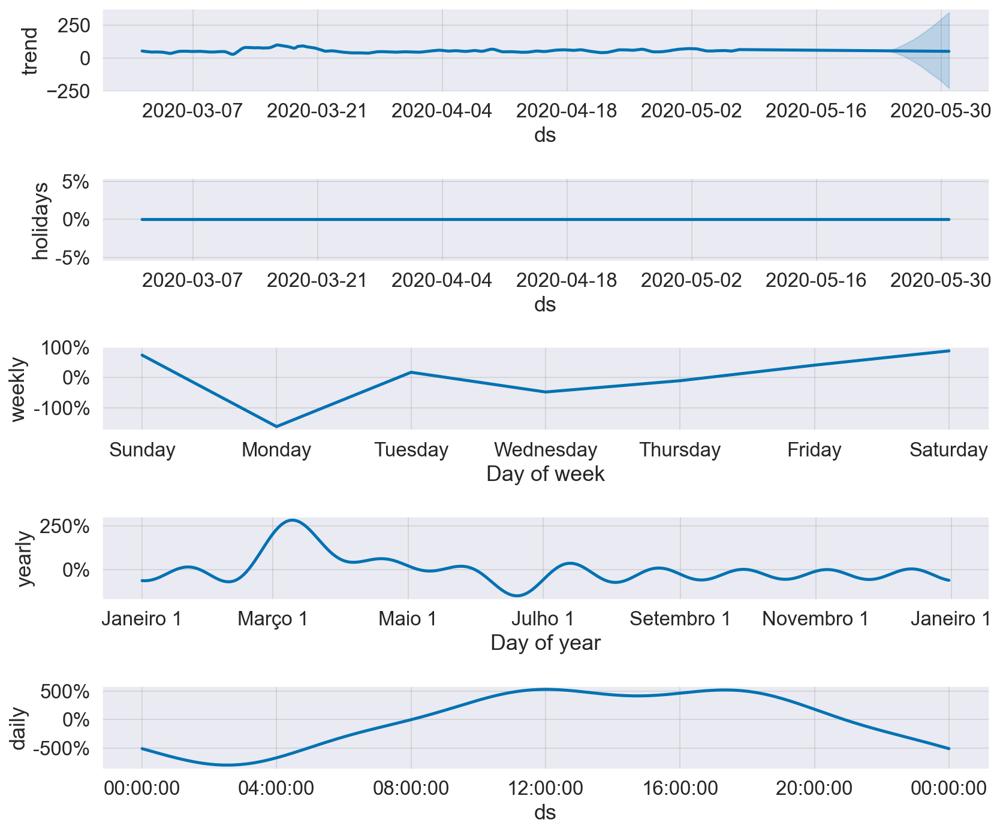

In [43]:
# Plot the components of the model
fig = final_prophet.plot_components(forecast_final, figsize=(12,10))

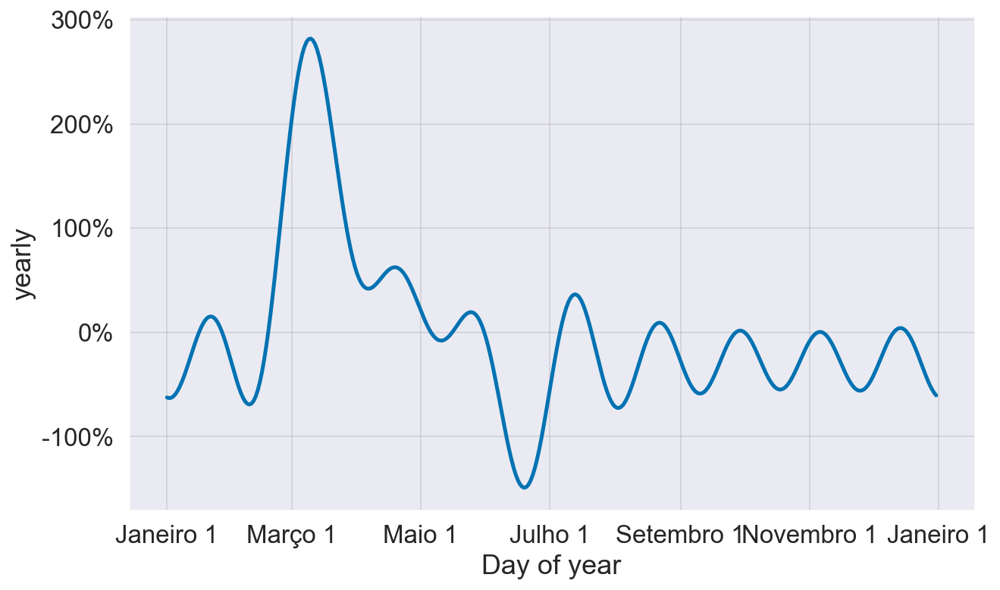

In [44]:
from fbprophet.plot import plot_weekly,plot_yearly, plot_seasonality,plot_seasonality_plotly

fig_y = plot_yearly(final_prophet)


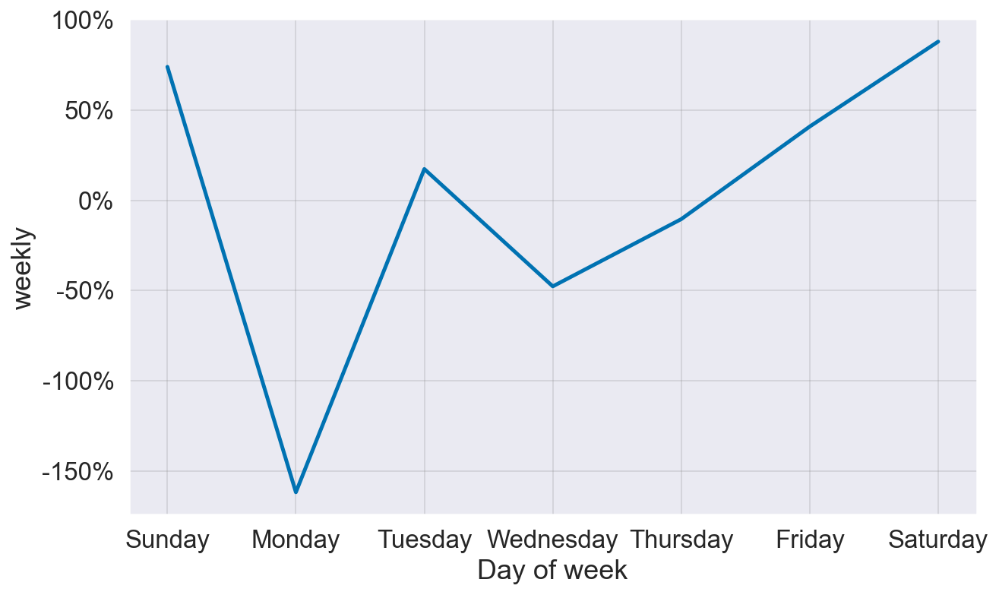

In [45]:
fig_w = plot_weekly(final_prophet)

In [ ]:
from fbprophet.diagnostics import performance_metrics, cross_validation
df_cv = cross_validation(final_prophet, initial='20 days', period = '10 days', horizon='7 days')
df_p = performance_metrics(df_cv)
df_p.head()

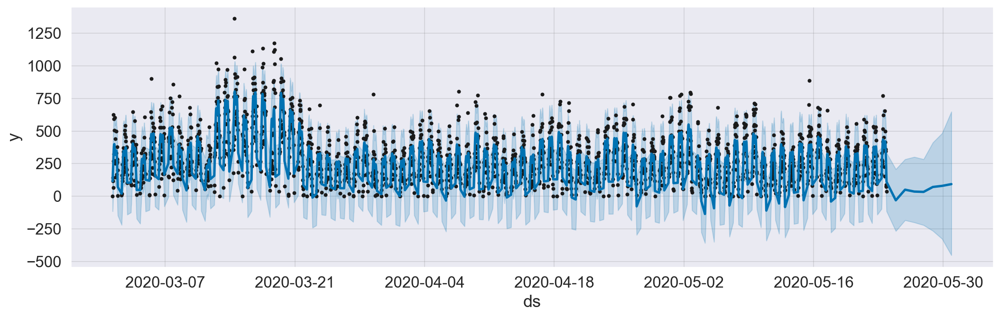

In [46]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_prophet.plot(forecast_final,ax=ax)
plt.show()

In [47]:
df_teste_final= final_prophet.predict(df_274_sale_teste)
iplot(dtview.plot_forecast_as_table(df_teste_final))

In [48]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sale_teste,
                                   df_teste_final,
                                   title='Previsão de vendas vs Vendas originais realizadas',
                                    mode='lines',
                                   name1='Teste',
                                   name2='Previsto',
                                  is_forecast=True))

# Comparando os dataframes de teste e previsto em escala diária

In [49]:
iplot(dtview.compare_dataframes_with_bar(
    df_274_sale_teste,
    df_teste_final,
    nametrace1='Teste',
    nametrace2='Previsto'))

In [50]:
print("MAPE (validação) ---> {}".format(fm.mape(np.array(df_274_sale_teste['y']), np.array(df_teste_final['yhat']))))

MAPE (validação) ---> 0.9937705792351115


In [51]:
print("Valor real: {};\nValor previsto: {};\nPrevisão inferior: {};\nPrevisão superior: {}"
      .format(
    df_274_sale_teste.y.sum(),
    df_teste_final.yhat.sum(),
    df_teste_final.yhat_lower.sum(),
    df_teste_final.yhat_upper.sum()))

Valor real: 55266;
Valor previsto: 50605.34932295134;
Previsão inferior: -131272.36312866144;
Previsão superior: 217985.1950448431


# Identificando os outliers

In [52]:
outliers = dtexp.detect_outlier(df_274_time_sale['y'])
sorted(outliers)
lim_inf, lim_sup = dtexp.calculate_iqr_score(outliers)
print('Outlier inferior {}, outlier superior {}'.format(lim_inf,lim_sup))

Outlier inferior 670.75, outlier superior 1292.75


In [53]:
df_sem_outliers = df_274_time_sale[df_274_time_sale['y'] < 670]
df_sem_outliers.info

<bound method DataFrame.info of                       ds    y
0    2020-03-01 07:30:00    2
1    2020-03-01 08:00:00  144
2    2020-03-01 08:30:00  117
3    2020-03-01 09:00:00   65
4    2020-03-01 09:30:00  271
...                  ...  ...
2550 2020-05-31 18:30:00  268
2551 2020-05-31 19:00:00  173
2552 2020-05-31 19:30:00  136
2553 2020-05-31 20:00:00   23
2554 2020-05-31 20:30:00   80

[2428 rows x 2 columns]>

###### Outlier são pontos de dados se desviam de forma acentuada dos outros pontos de dados em uma mesma amostra, é chamado de outlier. Qualquer outra observação esperada é rotulada como um inlier"Outliers são os valores em uma série, que se afastam de forma imprevista, dos valores esperados. Isso pode ocorrer em função de características particulares que afetam a variável analisada, erro na transcrição/registo dos valores da variável, etc. A visualização gráfica desses valores em boxplot auxilia a compreender o quanto eles estão distante do valor esperado. A caixa de cor sólida, representa os valores esperados, isto é, o maior conjunto de valores que se repete na série, enquanto os pontos fora da caixa representam os outliers.
`Conforme esclarece Montgomery, os outliers são pontos de dados incomuns que devem ser devidamente identificados para análise futura`

In [54]:
dtview.check_outliers_univariate(df_274_time_sale)

In [55]:
df_274_sem_outliers_treino, df_274_sem_outliers_teste = dtexp.configura_dataframe_treino_teste(df_sem_outliers)
print('-'*60)
print('Shape dataframe de treino --> {}'.format(df_274_sem_outliers_treino.shape))
print('Shape dataframe de teste --> {}'.format(df_274_sem_outliers_teste.shape))
print('-'*60)


------------------------------------------------------------
Shape dataframe de treino --> (2219, 2)
Shape dataframe de teste --> (210, 2)
------------------------------------------------------------


In [56]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sem_outliers_treino,
                                   df_274_sem_outliers_teste,
                                   title='Montante de dados de vendas de Treinamento e Teste (sem outliers)',
                                    mode='lines',
                                   name1='Treinamento',
                                   name2='Teste'))

In [57]:
prophet_no_outliers = Prophet()
prophet_no_outliers.fit(df_274_sem_outliers_treino)
future_no_outliers = prophet_no_outliers.make_future_dataframe(periods=7, freq='D')
# Removendo valores fora do range de atendimento da loja (22:30 - 05:59)
future_no_outliers['ds'] = pd.to_datetime(future_no_outliers['ds'])
future_no_outliers = future_no_outliers.set_index(pd.DatetimeIndex(future_no_outliers['ds']))
future_no_outliers = future_no_outliers.between_time('08:00','21:00')

forecast_no_outliers = prophet_no_outliers.predict(future_no_outliers)

iplot(dtview.plot_forecast_as_table(forecast_no_outliers))

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


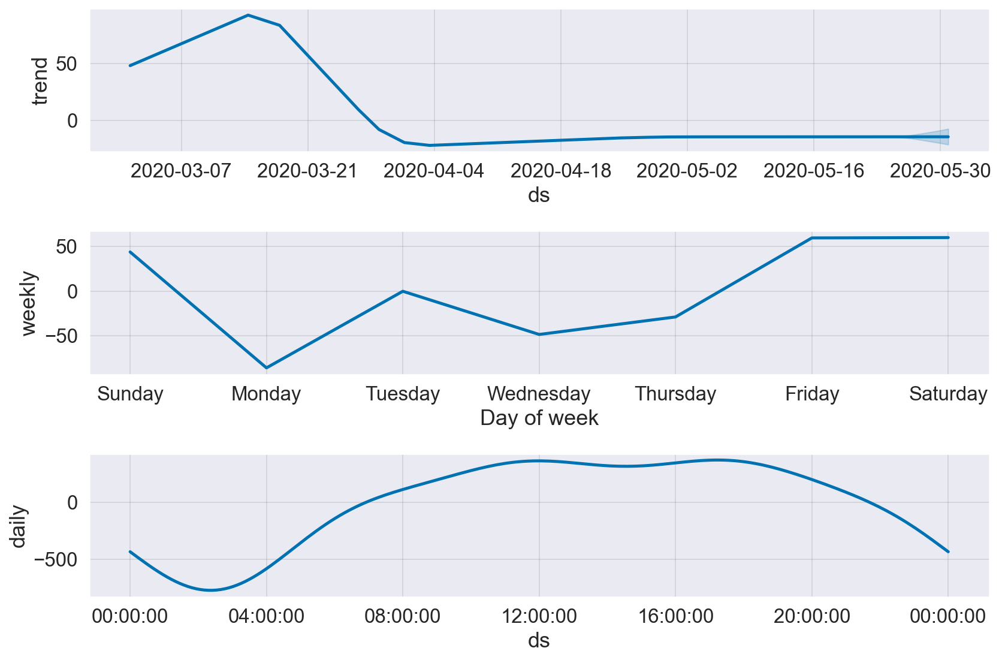

In [58]:
# componentes

fig = prophet_no_outliers.plot_components(forecast_no_outliers, figsize=(12,8))


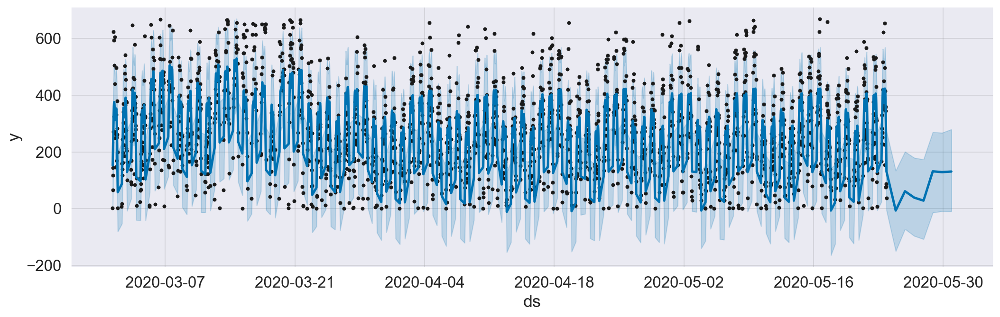

In [59]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = prophet_no_outliers.plot(forecast_no_outliers,ax=ax)
plt.show()

In [60]:
df_274_no_outliers_teste_forecast = prophet_no_outliers.predict(df_274_sem_outliers_teste)
iplot(dtview.plot_forecast_as_table(df_274_no_outliers_teste_forecast))

In [61]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sem_outliers_teste,
                                   df_274_no_outliers_teste_forecast,
                                   title='Previsão de vendas vs Vendas originais realizadas',
                                    mode='lines',
                                   name1='Teste',
                                   name2='Previsto',
                                  is_forecast=True))

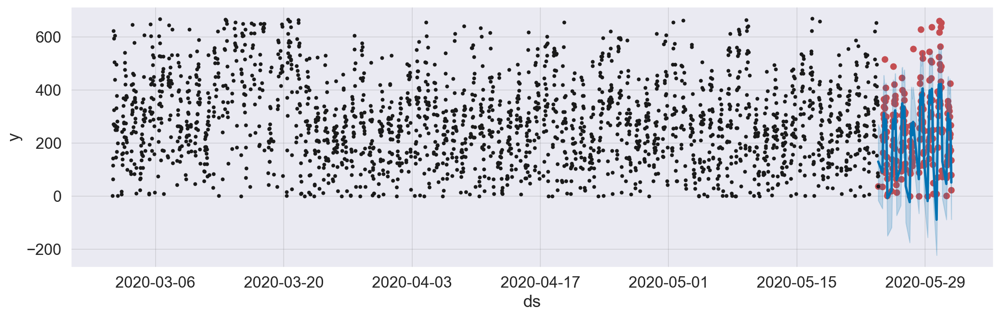

In [62]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_274_sem_outliers_teste.ds,df_274_sem_outliers_teste['y'], color='r')
fig = prophet_no_outliers.plot(df_274_no_outliers_teste_forecast,ax=ax)
plt.show()

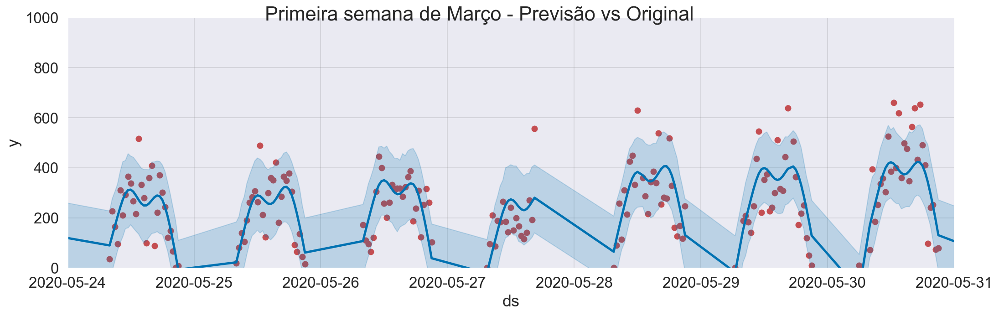

In [64]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_274_sem_outliers_teste.ds, df_274_sem_outliers_teste['y'], color='r')
fig = prophet_no_outliers.plot(df_274_no_outliers_teste_forecast, ax=ax)
ax.set_xbound(lower='2020-05-24', upper='2020-05-31')
ax.set_ylim(0, 1000)
plot = plt.suptitle('Primeira semana de Março - Previsão vs Original')

In [65]:
print("MAPE (validação) ---> {}".format(
    fm.mape(np.array(df_274_sem_outliers_teste['y']),
            np.array(df_274_no_outliers_teste_forecast['yhat']))))

MAPE (validação) ---> 1.281138849410778


In [66]:
iplot(dtview.compare_dataframes_with_bar(
        df_274_sem_outliers_teste,
        df_274_no_outliers_teste_forecast,
        nametrace1='Valor Real (sem outliers)',
        nametrace2='Valor Previsto (sem outliers)',
        idx_end=28))

In [67]:
prophet_feriados_s_outliers = Prophet(holidays=dtclean.get_Holiday())

prophet_feriados_s_outliers.add_country_holidays('BR')
prophet_feriados_s_outliers.fit(df_274_sem_outliers_treino)
# Criando as datas futuras previstas pelo prophet
# A frequência especificada em horas (os dados estão em horas)
future_feriados_s_outliers = prophet_feriados_s_outliers.make_future_dataframe(freq='D', periods=8)
# Prevendo os valores
forecast_feriados_s_outliers = prophet_feriados_s_outliers.predict(future_feriados_s_outliers)
# Removendo valores fora do range de atendimento da loja (22:30 - 05:59)
future_feriados_s_outliers['ds'] = pd.to_datetime(future_feriados_s_outliers['ds'])
future_feriados_s_outliers = future_feriados_s_outliers.set_index(pd.DatetimeIndex(future_feriados_s_outliers['ds']))
future_feriados_s_outliers = future_feriados_s_outliers.between_time('08:00','21:00')
# Previsão optimizada dos valores
future_feriados_s_outliers = prophet_feriados_s_outliers.predict(future_feriados_s_outliers)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


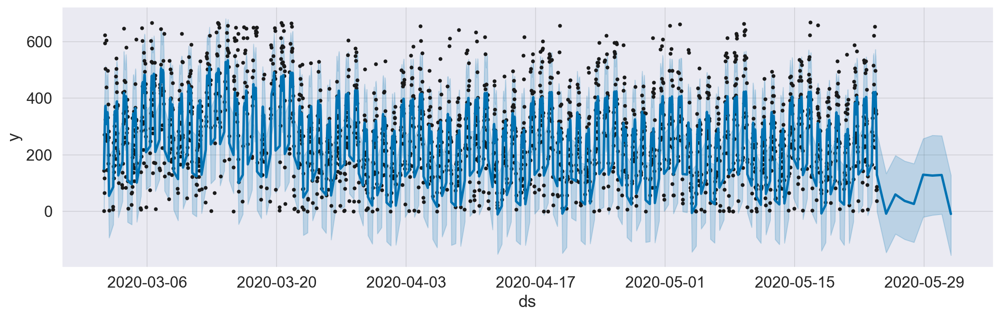

In [68]:
plt,fig_forecast_feriado_s_outliers = dtview.plot_forecast(future_feriados_s_outliers,prophet_feriados_s_outliers,f,ax)
plt.show()

# Visualizando os componentes do modelo

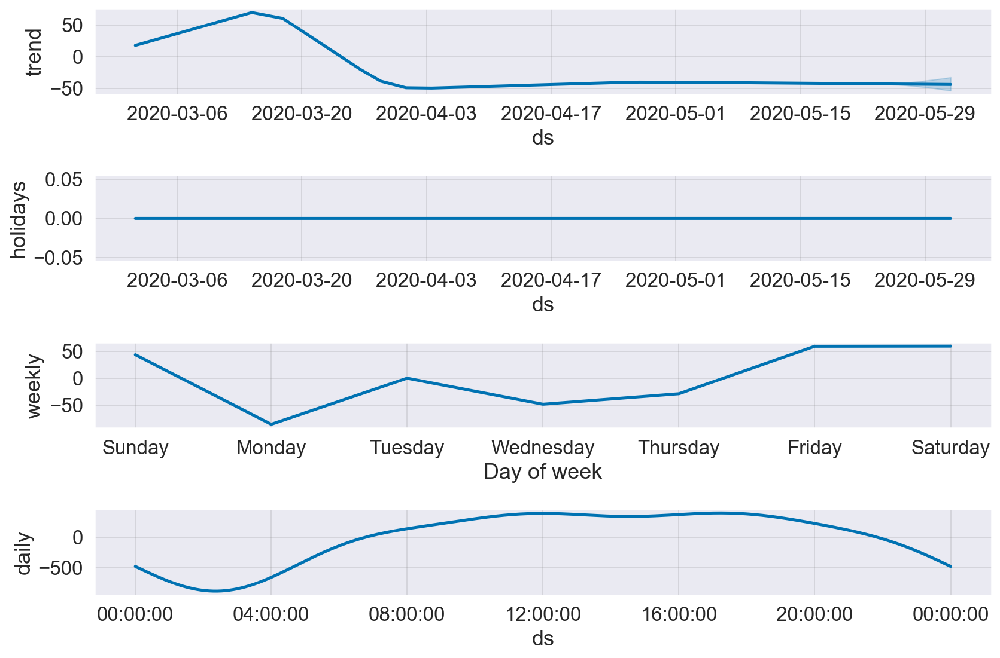

In [69]:
fig_forecast_feriado_s_outliers = prophet_feriados_s_outliers.plot_components(forecast_feriados_s_outliers,figsize=(12,8))

In [70]:
forecast_teste_feriados_s_outliers = prophet_feriados_s_outliers.predict(df_274_sem_outliers_teste)
iplot(dtview.plot_forecast_as_table(forecast_teste_feriados_s_outliers))

# Visualizar dataframe de teste previsto e original com feriados

In [71]:
iplot(dtview.compare_dataframes_with_scatter(
    df_274_sem_outliers_teste,
    forecast_teste_feriados_s_outliers,
    title='Dados Previsto vs Original última semana de maio/2020',
    mode='lines',
    name1='Original',
    name2='Previsão com feriados',
    is_forecast=True))

In [72]:
iplot(dtview.compare_dataframes_with_bar(
        df_274_sem_outliers_teste,
        forecast_teste_feriados_s_outliers,
        nametrace1='Original',
        nametrace2='Previsão com feriados',
        idx_end=28))

In [73]:
print("MAPE (validação) ---> {}".format(
    fm.mape(np.array(df_274_sem_outliers_teste['y']),
    np.array(forecast_teste_feriados_s_outliers['yhat']))))

MAPE (validação) ---> 1.3430296918733295


In [ ]:
# Somente utilizar para gerar novo conjunto otimizado de parâmetros atualmente esse conjunto está registado no arquivo:
# 'model_parameters_274_vendas_s_outliers.csv'
# dtexp.tuning_model(df_274_sem_outliers_treino,df_sem_outliers,periodo=219,frequencia='D',loja='274',tipo='vendas_s_outliers')

In [74]:
parameters_df_s_outliers = pd.read_csv('model_parameters_274_vendas_s_outliers.csv',sep='\t')
parameters_df_s_outliers = parameters_df_s_outliers.sort_values(by=['MAPE'])
parameters_df_s_outliers = parameters_df_s_outliers.reset_index(drop=True)
parameters_df_s_outliers.drop(['Unnamed: 0'],axis=1,inplace=True)
trace_df_parameters_s_outliers=go.Table(header=dict(values=list(parameters_df_s_outliers[['MAPE','Parameters']])),
                            cells=dict(values=[parameters_df_s_outliers.MAPE,
                                               parameters_df_s_outliers.Parameters]))
data=[trace_df_parameters_s_outliers]
fig_df_parameters_s_outliers=go.Figure(data=data)
iplot(fig_df_parameters_s_outliers)

In [75]:
# Configurando e treinando o modelo com feriados e parâmetros otimizados
final_prophet_s_outliers = Prophet(holidays=dtclean.get_Holiday(),
                      changepoint_prior_scale= 15,
                      holidays_prior_scale = 15,
                      n_changepoints = 200,
                      seasonality_mode = 'multiplicative',
                      seasonality_prior_scale = 25,
                      weekly_seasonality=True,
                      daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)
final_prophet_s_outliers.add_country_holidays(country_name='BR')
final_prophet_s_outliers.fit(df_274_sem_outliers_treino)

In [76]:
future_final_s_outliers = final_prophet_s_outliers.make_future_dataframe(periods=122, freq='D')
forecast_final_s_outliers = final_prophet_s_outliers.predict(future_final_s_outliers)
iplot(dtview.plot_forecast_as_table(forecast_final_s_outliers))

In [77]:
iplot(dtview.plot_forecast_as_table(forecast_final_s_outliers))

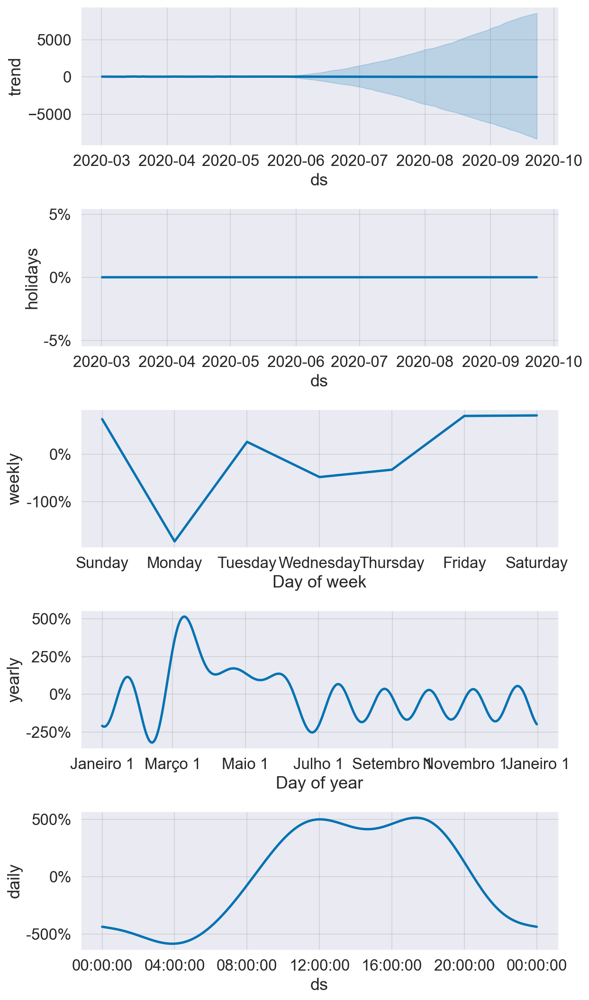

In [78]:
# Plot the components of the model
fig = final_prophet_s_outliers.plot_components(forecast_final_s_outliers)

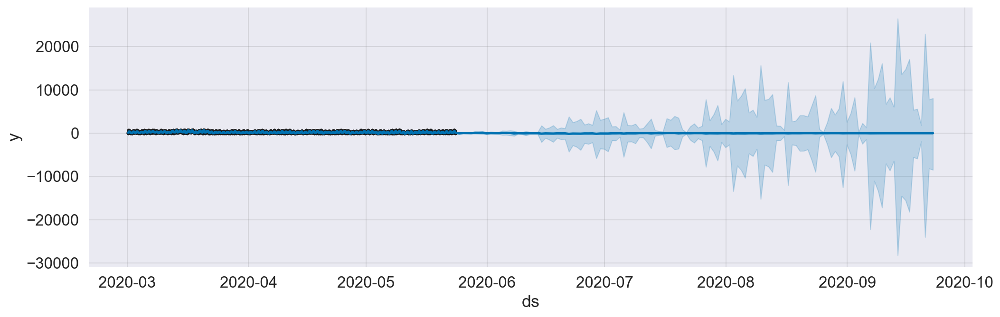

In [79]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_prophet_s_outliers.plot(forecast_final_s_outliers,ax=ax)
plt.show()

In [80]:
# Visualizando a tabela prevista

df_teste_final_s_outliers= final_prophet_s_outliers.predict(df_274_sem_outliers_teste)
iplot(dtview.plot_forecast_as_table(df_teste_final_s_outliers))

In [81]:
# Comparando os dataframes em gráfico scatter

iplot(dtview.compare_dataframes_with_scatter(df_274_sem_outliers_teste,
                                   df_teste_final_s_outliers,
                                   title='Previsão de vendas vs Vendas originais realizadas',
                                    mode='lines',
                                   name1='Teste',
                                   name2='Previsto',
                                  is_forecast=True))

In [82]:
# Comparando os dataframes em gráfico de barras

iplot(dtview.compare_dataframes_with_bar(
    df_274_sem_outliers_teste,
    df_teste_final_s_outliers,
    nametrace1='Teste',
    nametrace2='Previsto'))

In [83]:
print("MAPE (validação) ---> {}".format(
    fm.mape(np.array(df_274_sem_outliers_teste['y']),
    np.array(df_teste_final_s_outliers['yhat']))))

MAPE (validação) ---> 0.9929490843719694


In [84]:
print("Valor real: {};\nValor previsto: {};\nPrevisão inferior: {};\nPrevisão superior: {}"
      .format(
    df_274_sem_outliers_teste.y.sum(),
    df_teste_final_s_outliers.yhat.sum(),
    df_teste_final_s_outliers.yhat_lower.sum(),
    df_teste_final_s_outliers.yhat_upper.sum()))

Valor real: 53817;
Valor previsto: 52413.5211582732;
Previsão inferior: -40579.122508803186;
Previsão superior: 142386.41378184964


# Dataframe diário

In [85]:
print('Data início: {}, Data final: {}'.format(df_274_sale.ds.min(),df_274_sale.ds.max()))
df_274_sale.info()

Data início: 2020-03-01 00:00:00, Data final: 2020-05-31 00:00:00
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92 entries, 0 to 91
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      92 non-null     datetime64[ns]
 1   y       92 non-null     int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 1.6 KB


In [86]:
iplot(dtview.plot_scatter(df_274_sale,title='Produtos vendidos'))

In [87]:
df_274_sale.describe()


,y
count,92.000000
mean,8470.815217
std,3066.441539
min,3523.000000
25%,6285.750000
50%,7919.000000
75%,9581.500000
max,17868.000000


In [ ]:
model = Prophet(interval_width=0.95)
model.fit(df_274_sale)
forecast = model.predict(df_274_sale)
model.plot(forecast)

In [ ]:
print("Valor real: {};\nValor previsto: {};\nPrevisão inferior: {};\nPrevisão superior: {}"
      .format(
    df_274_sale.y.sum(),
    forecast.yhat.sum(),
    forecast.yhat_lower.sum(),
    forecast.yhat_upper.sum()))

# Análise dos Dados

In [ ]:
iplot(dtview.plot_scatter(df_274_sale,title='Vendas/dia (março-maio de 2020)'))

In [ ]:
df_new = dtexp.date_features(df_274_sale)
iplot(dtview.plot_df_features_as_table(df_new))

In [ ]:
fig, ax = plt.subplots(figsize=(14,5))
dtview.plot_df_features(df_new,fig, ax).show()
#plt.show()

In [ ]:
fig,(ax1,ax2)= plt.subplots(nrows=2)
fig.set_size_inches(20,30)

mesAgregado = pd.DataFrame(df_new.groupby("semana")["y"].sum()).reset_index().sort_values('y')
sns.barplot(data=mesAgregado,x="semana",y="y",ax=ax1)
ax1.set(xlabel='Vendas', ylabel='Total Produtos vendidos')
ax1.set_title("Total Vendas Mês",fontsize=15)

semanaAgregada = pd.DataFrame(df_new.groupby("num")["y"].sum()).reset_index().sort_values('num')
sns.barplot(data=semanaAgregada,x="num",y="y",ax=ax2)
ax2.set(xlabel='diasemana', ylabel='Total Vendas')
ax2.set_title("Total Vendas Por Dia da Semana",fontsize=15)

In [ ]:
semanaAgregada.sort_values('y')

In [ ]:
df_274_sale_treino_diario, df_274_sale_teste_diario = dtexp.configura_dataframe_treino_teste(df_274_sale)
print('-'*60)
print('Shape dataframe de treino --> {}'.format(df_274_sale_treino_diario.shape))
print('Shape dataframe de teste --> {}'.format(df_274_sale_teste_diario.shape))
print('-'*60)

In [ ]:
# Visualizando o montante de dados para os datasets de treino e de teste

In [ ]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sale_treino_diario,
                                   df_274_sale_teste_diario,
                                   title='Montante de dados de vendas de Treinamento e Teste',
                                    mode='lines',
                                   name1='Treinamento',
                                   name2='Teste'))

In [ ]:
prophet = Prophet()
prophet.fit(df_274_sale_treino_diario)
future_vendas = prophet.make_future_dataframe(periods=7, freq='D')
# Removendo valores fora do range de atendimento da loja (22:30 - 05:59)
future_vendas['ds'] = pd.to_datetime(future_vendas['ds'])
future_vendas = future_vendas.set_index(pd.DatetimeIndex(future_vendas['ds']))
future_vendas = future_vendas.between_time('08:00','21:00')

forecast_vendas = prophet.predict(future_vendas)

iplot(dtview.plot_forecast_as_table(forecast_vendas))

In [ ]:
# componentes

fig = prophet.plot_components(forecast_vendas, figsize=(12,8))

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = prophet.plot(forecast_vendas,ax=ax)
plt.show()

In [ ]:
df_274_sale_teste_diario_forecast = prophet.predict(df_274_sale_teste_diario)
iplot(dtview.plot_forecast_as_table(df_274_sale_teste_diario_forecast))

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_274_sale_teste_diario.ds,df_274_sale_teste_diario['y'], color='r')
fig = prophet.plot(df_274_sale_teste_diario_forecast,ax=ax)
plt.show()


In [ ]:
# Comparação entre as vendas previstas e realizadas


In [ ]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sale_teste_diario,
                                   df_274_sale_teste_diario_forecast,
                                   title='Previsão de vendas vs Vendas originais realizadas',
                                    mode='lines',
                                   name1='Teste',
                                   name2='Previsto',
                                  is_forecast=True))

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_274_sale_teste_diario.ds, df_274_sale_teste_diario['y'], color='r')
fig = prophet.plot(df_274_sale_teste_diario_forecast, ax=ax)
ax.set_xbound(lower='2020-03-01', upper='2020-03-08')
ax.set_ylim(0, 1000)
plot = plt.suptitle('Primeira semana de Março - Previsão vs Original')

In [ ]:
mape_sem_feriados = dtexp.mean_absolute_percentage_error(df_274_sale_teste_diario['y'],df_274_sale_teste_diario_forecast['yhat'])
print("MAPE -------------> ",round(mape_sem_feriados,4))
print("MAPE para validar ------> {}".format(fm.mape(np.array(df_274_sale_teste_diario['y']), np.array(df_274_sale_teste_diario_forecast['yhat']))))

In [ ]:
print("Valor real: {};\nValor previsto: {};\nPrevisão inferior: {};\nPrevisão superior: {}"
      .format(
    df_274_sale_teste_diario.y.sum(),
    df_274_sale_teste_diario_forecast.yhat.sum(),
    df_274_sale_teste_diario_forecast.yhat_lower.sum(),
    df_274_sale_teste_diario_forecast.yhat_upper.sum()))

In [ ]:
iplot(dtview.compare_dataframes_with_bar(
    df_274_sale_teste_diario,
    df_274_sale_teste_diario_forecast,
    nametrace1='Valor Real',
    nametrace2='Valor Previsto',
    idx_end=28))

In [ ]:
# Criando novo modelo com os feriados

In [ ]:
# definindo o cap (carrying capacity)
#df_274_sale_treino_diario['cap'] = 1362*2
#df_274_sale_treino_diario['floor'] = 1
#df_274_sale_treino_diario.reset_index(drop=True)
prophet_feriados = Prophet(holidays=dtclean.get_Holiday())
prophet_feriados.add_country_holidays('BR')
prophet_feriados.fit(df_274_sale_treino_diario)
# Criando as datas futuras previstas pelo prophet
# A frequência especificada em dias (os dados estão em dias)
future_feriados = prophet_feriados.make_future_dataframe(freq='D', periods=8)
# Prevendo os valores
forecast_feriados = prophet_feriados.predict(future_feriados)
# Removendo valores fora do range de atendimento da loja (22:30 - 05:59)
future_feriados['ds'] = pd.to_datetime(future_feriados['ds'])
future_feriados = future_feriados.set_index(pd.DatetimeIndex(future_feriados['ds']))
future_feriados = future_feriados.between_time('08:00','21:00')
# Previsão optimizada dos valores
forecast_feriados = prophet_feriados.predict(future_feriados)
iplot(dtview.plot_forecast_as_table(forecast_feriados))

In [ ]:
plt,fig_forecast_feriado = dtview.plot_forecast(forecast_feriados,prophet_feriados,f,ax)
plt.show()

In [ ]:
# Visualizando os componentes do modelo

In [ ]:
fig_forecast_feriado = prophet_feriados.plot_components(forecast_feriados, figsize=(12,8))

## Visualizar tabela de previsão de teste

In [ ]:
forecast_teste_feriados = prophet_feriados.predict(df_274_sale_teste_diario)
iplot(dtview.plot_forecast_as_table(forecast_teste_feriados))

## Visualizar dataframe de teste previsto e original com feriados

In [ ]:
iplot(dtview.compare_dataframes_with_scatter(
    df_274_sale_teste_diario,
    forecast_teste_feriados,
    title='Dados Previsto vs Original última semana de maio/2020',
    mode='lines',
    name1='Original',
    name2='Previsão com feriados',
    is_forecast=True))

In [ ]:
mape_com_feriados = dtexp.mean_absolute_percentage_error(df_274_sale_teste_diario.y,forecast_teste_feriados.yhat)
print("MAPE",round(mape_com_feriados,4))

In [ ]:
print("Valor real: {};\nValor previsto: {};\nPrevisão inferior: {};\nPrevisão superior: {}"
      .format(
    df_274_sale_teste_diario.y.sum(),
    forecast_teste_feriados.yhat.sum(),
    forecast_teste_feriados.yhat_lower.sum(),
    forecast_teste_feriados.yhat_upper.sum()))

In [ ]:
'''Utilizar apenas quando prever melhor conjunto de parâmetros. Acessar o arquivo model_parameters_274_vendas.csv'''
# dtexp.tuning_model(df_274_sale_treino_diario,df_274_sale,periodo=226,frequencia='D',loja='274',tipo='vendas')

In [ ]:
parameters_df = pd.read_csv('model_parameters_274_vendas.csv',sep='\t')
parameters_df = parameters_df.sort_values(by=['MAPE'])
parameters_df = parameters_df.reset_index(drop=True)
parameters_df.drop(['Unnamed: 0'],axis=1,inplace=True)
trace_df_parameters=go.Table(header=dict(values=list(parameters_df[['MAPE','Parameters']])),
                            cells=dict(values=[parameters_df.MAPE,
                                               parameters_df.Parameters]))
data=[trace_df_parameters]
fig_df_parameters=go.Figure(data=data)
iplot(fig_df_parameters)


In [ ]:
## Treinando o modelo com os melhores parâmetros identificados

+ changepoint_prior_scale= 15
+ holidays_prior_scale = 15
+ n_changepoints = 200
+ seasonality_mode = 'multiplicative'
+ seasonality_prior_scale = 25

In [ ]:
# Configurando e treinando o modelo com feriados e parâmetros otimizados
final_prophet = Prophet(holidays=dtclean.get_Holiday(),
                      changepoint_prior_scale= 15,
                      holidays_prior_scale = 15,
                      n_changepoints = 200,
                      seasonality_mode = 'multiplicative',
                      seasonality_prior_scale = 25,
                      weekly_seasonality=True,
                      daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)
final_prophet.add_country_holidays(country_name='BR')
final_prophet.fit(df_274_sale_treino_diario)

In [ ]:
future_final = final_prophet.make_future_dataframe(periods=12, freq='D')
forecast_final = final_prophet.predict(future_final)
iplot(dtview.plot_forecast_as_table(forecast_final))

In [ ]:
# Plot the components of the model
fig = final_prophet.plot_components(forecast_final, figsize=(12,10))

In [ ]:
from fbprophet.plot import plot_weekly,plot_yearly, plot_seasonality,plot_seasonality_plotly

fig_y = plot_yearly(final_prophet)


In [ ]:
fig_w = plot_weekly(final_prophet)

In [ ]:
from fbprophet.diagnostics import performance_metrics, cross_validation
df_cv = cross_validation(final_prophet, initial='20 days', period = '10 days', horizon='12 days')
df_p = performance_metrics(df_cv)
df_p.head()

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_prophet.plot(forecast_final,ax=ax)
plt.show()

In [ ]:
df_teste_final= final_prophet.predict(df_274_sale_teste_diario)
iplot(dtview.plot_forecast_as_table(df_teste_final))

In [ ]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sale_teste_diario,
                                   df_teste_final,
                                   title='Previsão de vendas vs Vendas originais realizadas',
                                    mode='lines',
                                   name1='Teste',
                                   name2='Previsto',
                                  is_forecast=True))

# Comparando os dataframes de teste e previsto em escala diária

In [ ]:
iplot(dtview.compare_dataframes_with_bar(
    df_274_sale_teste_diario,
    df_teste_final,
    nametrace1='Teste',
    nametrace2='Previsto'))

In [ ]:
mape_final = dtexp.mean_absolute_percentage_error(df_274_sale_teste_diario['y'],df_teste_final['yhat'])
print("MAPE -------------> ",round(mape_final,4))
print("MAPE (validação) ---> {}".format(fm.mape(np.array(df_274_sale_teste_diario['y']), np.array(df_teste_final['yhat']))))

In [ ]:
print("Valor real: {};\nValor previsto: {};\nPrevisão inferior: {};\nPrevisão superior: {}"
      .format(
    df_274_sale_teste_diario.y.sum(),
    df_teste_final.yhat.sum(),
    df_teste_final.yhat_lower.sum(),
    df_teste_final.yhat_upper.sum()))

# Identificando os outliers

In [ ]:
outliers = dtexp.detect_outlier(df_274_sale['y'])
sorted(outliers)
lim_inf, lim_sup = dtexp.calculate_iqr_score(outliers)
print('Outlier inferior {}, outlier superior {}'.format(lim_inf,lim_sup))

In [ ]:
df_sem_outliers = df_274_sale[df_274_sale['y'] < 670]
df_sem_outliers.info

###### Outlier são pontos de dados se desviam de forma acentuada dos outros pontos de dados em uma mesma amostra, é chamado de outlier. Qualquer outra observação esperada é rotulada como um inlier"Outliers são os valores em uma série, que se afastam de forma imprevista, dos valores esperados. Isso pode ocorrer em função de características particulares que afetam a variável analisada, erro na transcrição/registo dos valores da variável, etc. A visualização gráfica desses valores em boxplot auxilia a compreender o quanto eles estão distante do valor esperado. A caixa de cor sólida, representa os valores esperados, isto é, o maior conjunto de valores que se repete na série, enquanto os pontos fora da caixa representam os outliers.
`Conforme esclarece Montgomery, os outliers são pontos de dados incomuns que devem ser devidamente identificados para análise futura`

In [ ]:
dtview.check_outliers_univariate(df_274_sale)

In [ ]:
df_274_sem_outliers_treino, df_274_sem_outliers_teste = dtexp.configura_dataframe_treino_teste(df_sem_outliers)
print('-'*60)
print('Shape dataframe de treino --> {}'.format(df_274_sem_outliers_treino.shape))
print('Shape dataframe de teste --> {}'.format(df_274_sem_outliers_teste.shape))
print('-'*60)


In [ ]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sem_outliers_treino,
                                   df_274_sem_outliers_teste,
                                   title='Montante de dados de vendas de Treinamento e Teste (sem outliers)',
                                    mode='lines',
                                   name1='Treinamento',
                                   name2='Teste'))

In [ ]:
prophet_no_outliers = Prophet()
prophet_no_outliers.fit(df_274_sem_outliers_treino)
future_no_outliers = prophet_no_outliers.make_future_dataframe(periods=7, freq='D')
# Removendo valores fora do range de atendimento da loja (22:30 - 05:59)
future_no_outliers['ds'] = pd.to_datetime(future_no_outliers['ds'])
future_no_outliers = future_no_outliers.set_index(pd.DatetimeIndex(future_no_outliers['ds']))
future_no_outliers = future_no_outliers.between_time('08:00','21:00')

forecast_no_outliers = prophet_no_outliers.predict(future_no_outliers)

iplot(dtview.plot_forecast_as_table(forecast_no_outliers))

In [ ]:
# componentes

fig = prophet_no_outliers.plot_components(forecast_no_outliers, figsize=(12,8))


In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = prophet_no_outliers.plot(forecast_no_outliers,ax=ax)
plt.show()

In [ ]:
df_274_no_outliers_teste_forecast = prophet_no_outliers.predict(df_274_sem_outliers_teste)
iplot(dtview.plot_forecast_as_table(df_274_no_outliers_teste_forecast))

In [ ]:
iplot(dtview.compare_dataframes_with_scatter(df_274_sem_outliers_teste,
                                   df_274_no_outliers_teste_forecast,
                                   title='Previsão de vendas vs Vendas originais realizadas',
                                    mode='lines',
                                   name1='Teste',
                                   name2='Previsto',
                                  is_forecast=True))

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_274_sem_outliers_teste.ds,df_274_sem_outliers_teste['y'], color='r')
fig = prophet_no_outliers.plot(df_274_no_outliers_teste_forecast,ax=ax)
plt.show()

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_274_sem_outliers_teste.ds, df_274_sem_outliers_teste['y'], color='r')
fig = prophet_no_outliers.plot(df_274_no_outliers_teste_forecast, ax=ax)
ax.set_xbound(lower='2020-03-01', upper='2020-03-08')
ax.set_ylim(0, 1000)
plot = plt.suptitle('Primeira semana de Março - Previsão vs Original')

In [ ]:
mape_sem_feriados = dtexp.mean_absolute_percentage_error(df_274_sem_outliers_teste['y'],df_274_no_outliers_teste_forecast['yhat'])
print("MAPE -------------> ",round(mape_sem_feriados,4))
print("MAPE (validação) ---> {}".format(
    fm.mape(np.array(df_274_sem_outliers_teste['y']),
            np.array(df_274_no_outliers_teste_forecast['yhat']))))

In [ ]:
iplot(dtview.compare_dataframes_with_bar(
        df_274_sem_outliers_teste,
        df_274_no_outliers_teste_forecast,
        nametrace1='Valor Real (sem outliers)',
        nametrace2='Valor Previsto (sem outliers)',
        idx_end=28))

In [ ]:
prophet_feriados_s_outliers = Prophet(holidays=dtclean.get_Holiday())

prophet_feriados_s_outliers.add_country_holidays('BR')
prophet_feriados_s_outliers.fit(df_274_sem_outliers_treino)
# Criando as datas futuras previstas pelo prophet
# A frequência especificada em dias (os dados estão em dias)
future_feriados_s_outliers = prophet_feriados_s_outliers.make_future_dataframe(freq='D', periods=8)
# Prevendo os valores
forecast_feriados_s_outliers = prophet_feriados_s_outliers.predict(future_feriados_s_outliers)
# Removendo valores fora do range de atendimento da loja (22:30 - 05:59)
future_feriados_s_outliers['ds'] = pd.to_datetime(future_feriados_s_outliers['ds'])
future_feriados_s_outliers = future_feriados_s_outliers.set_index(pd.DatetimeIndex(future_feriados_s_outliers['ds']))
future_feriados_s_outliers = future_feriados_s_outliers.between_time('08:00','21:00')
# Previsão optimizada dos valores
future_feriados_s_outliers = prophet_feriados_s_outliers.predict(future_feriados_s_outliers)

In [ ]:
plt,fig_forecast_feriado_s_outliers = dtview.plot_forecast(future_feriados_s_outliers,prophet_feriados_s_outliers,f,ax)
plt.show()

# Visualizando os componentes do modelo

In [ ]:
fig_forecast_feriado_s_outliers = prophet_feriados_s_outliers.plot_components(forecast_feriados_s_outliers,figsize=(12,8))

In [ ]:
forecast_teste_feriados_s_outliers = prophet_feriados_s_outliers.predict(df_274_sem_outliers_teste)
iplot(dtview.plot_forecast_as_table(forecast_teste_feriados_s_outliers))

# Visualizar dataframe de teste previsto e original com feriados

In [ ]:
iplot(dtview.compare_dataframes_with_scatter(
    df_274_sem_outliers_teste,
    forecast_teste_feriados_s_outliers,
    title='Dados Previsto vs Original última semana de maio/2020',
    mode='lines',
    name1='Original',
    name2='Previsão com feriados',
    is_forecast=True))

In [ ]:
iplot(dtview.compare_dataframes_with_bar(
        df_274_sem_outliers_teste,
        forecast_teste_feriados_s_outliers,
        nametrace1='Original',
        nametrace2='Previsão com feriados',
        idx_end=28))

In [ ]:
mape_com_feriados = dtexp.mean_absolute_percentage_error(df_274_sem_outliers_teste.y,forecast_teste_feriados_s_outliers.yhat)
print("MAPE -------------> ",round(mape_com_feriados,4))
print("MAPE (validação) ---> {}".format(
    fm.mape(np.array(df_274_sem_outliers_teste['y']),
    np.array(forecast_teste_feriados_s_outliers['yhat']))))

In [ ]:
# Somente utilizar para gerar novo conjunto otimizado de parâmetros atualmente esse conjunto está registado no arquivo:
# 'model_parameters_274_vendas_s_outliers.csv'
# dtexp.tuning_model(df_274_sem_outliers_treino,df_sem_outliers,periodo=219,frequencia='D',loja='274',tipo='vendas_s_outliers')

In [ ]:
parameters_df_s_outliers = pd.read_csv('model_parameters_274_vendas_s_outliers.csv',sep='\t')
parameters_df_s_outliers = parameters_df_s_outliers.sort_values(by=['MAPE'])
parameters_df_s_outliers = parameters_df_s_outliers.reset_index(drop=True)
parameters_df_s_outliers.drop(['Unnamed: 0'],axis=1,inplace=True)
trace_df_parameters_s_outliers=go.Table(header=dict(values=list(parameters_df_s_outliers[['MAPE','Parameters']])),
                            cells=dict(values=[parameters_df_s_outliers.MAPE,
                                               parameters_df_s_outliers.Parameters]))
data=[trace_df_parameters_s_outliers]
fig_df_parameters_s_outliers=go.Figure(data=data)
iplot(fig_df_parameters_s_outliers)

In [ ]:
# Configurando e treinando o modelo com feriados e parâmetros otimizados
final_prophet_s_outliers = Prophet(holidays=dtclean.get_Holiday(),
                      changepoint_prior_scale= 15,
                      holidays_prior_scale = 15,
                      n_changepoints = 200,
                      seasonality_mode = 'multiplicative',
                      seasonality_prior_scale = 25,
                      weekly_seasonality=True,
                      daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)
final_prophet_s_outliers.add_country_holidays(country_name='BR')
final_prophet_s_outliers.fit(df_274_sem_outliers_treino)

In [ ]:
future_final_s_outliers = final_prophet_s_outliers.make_future_dataframe(periods=122, freq='D')
forecast_final_s_outliers = final_prophet_s_outliers.predict(future_final_s_outliers)
iplot(dtview.plot_forecast_as_table(forecast_final_s_outliers))

In [ ]:
iplot(dtview.plot_forecast_as_table(forecast_final_s_outliers))

In [ ]:
# Plot the components of the model
fig = final_prophet_s_outliers.plot_components(forecast_final_s_outliers)

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_prophet_s_outliers.plot(forecast_final_s_outliers,ax=ax)
plt.show()

In [ ]:
# Visualizando a tabela prevista

df_teste_final_s_outliers= final_prophet_s_outliers.predict(df_274_sem_outliers_teste)
iplot(dtview.plot_forecast_as_table(df_teste_final_s_outliers))

In [ ]:
# Comparando os dataframes em gráfico scatter

iplot(dtview.compare_dataframes_with_scatter(df_274_sem_outliers_teste,
                                   df_teste_final_s_outliers,
                                   title='Previsão de vendas vs Vendas originais realizadas',
                                    mode='lines',
                                   name1='Teste',
                                   name2='Previsto',
                                  is_forecast=True))

In [ ]:
# Comparando os dataframes em gráfico de barras

iplot(dtview.compare_dataframes_with_bar(
    df_274_sem_outliers_teste,
    df_teste_final_s_outliers,
    nametrace1='Teste',
    nametrace2='Previsto'))

In [ ]:
# Calculando o mape

mape_final = dtexp.mean_absolute_percentage_error(df_274_sem_outliers_teste['y'],df_teste_final_s_outliers['yhat'])
print("MAPE -------------> ",round(mape_final,4))
print("MAPE (validação) ---> {}".format(
    fm.mape(np.array(df_274_sem_outliers_teste['y']),
    np.array(df_teste_final_s_outliers['yhat']))))



